#🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow and TensorFlow Hub.

## 1. Problem

Identify the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed f dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.

* There are 120 breeds of dogs (this means there are 120 different classes).

* There are around 10,000+ images in the training set (these images have labels).

* There are around 10,000+ images in the test set (these images have no labels, because we''ll want to predict them).

In [4]:
# !unzip '/content/drive/MyDrive/Portfolio/Dog-vision-project/dog-breed-identification.zip' -d '/content/drive/MyDrive/Portfolio/Dog-vision-project'

## Importing tools and libraries


In [5]:
# Import necesary tools
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
import numpy as np
import os
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from tensorflow.keras.callbacks import TensorBoard
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [6]:
# Check our Tensorflow version
print('TF version:', tf.__version__)
print('TF Hub version', hub.__version__)

# Check for GPU availability
print('GPU', 'is available' if tf.config.list_physical_devices('GPU') else 'not available')

TF version: 2.15.0
TF Hub version 0.15.0
GPU not available


## Exploratory data analysis


In [7]:
# Checkout the labels of the data
labels_csv = pd.read_csv('/content/drive/MyDrive/Portfolio/Dog-vision-project/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

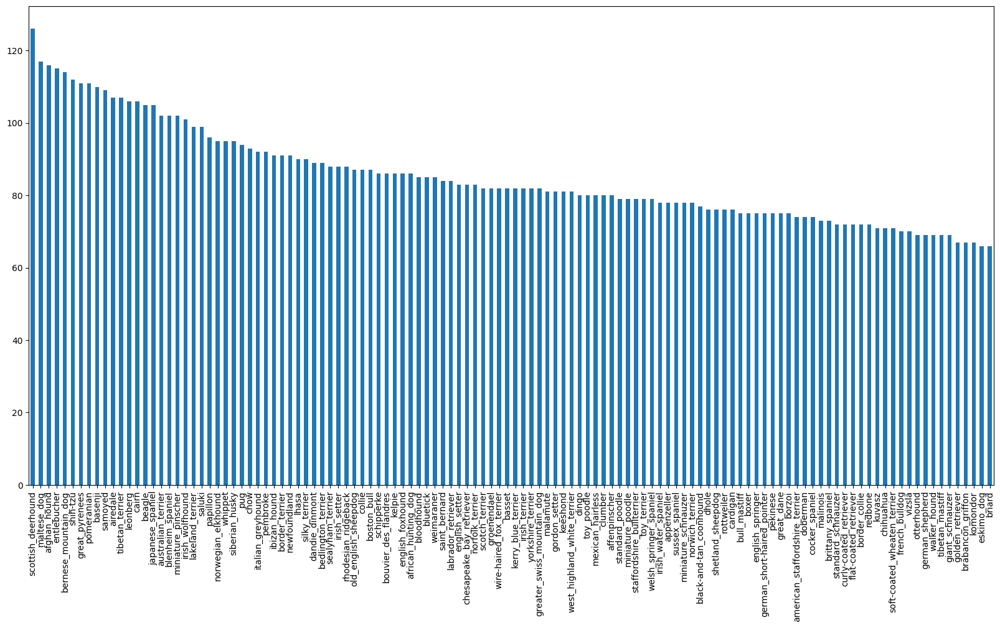

In [9]:
# How many images are there of each breed
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10))

In [10]:
labels_csv['breed'].value_counts().median()

82.0

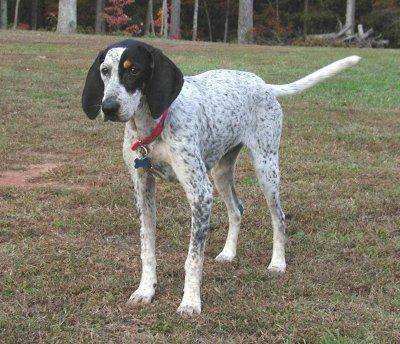

In [11]:
# Let's view an image
from IPython.display import Image
Image('/content/drive/MyDrive/Portfolio/Dog-vision-project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg')

### Getting images and their labels

Let's get a list of all our list image file pathnames.

In [12]:
# Create pathnames from Image ID's
filenames = ['/content/drive/MyDrive/Portfolio/Dog-vision-project/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Portfolio/Dog-vision-project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [13]:
# Check whether number of filenames matches number of actual image files
if len(os.listdir('/content/drive/MyDrive/Portfolio/Dog-vision-project/train/')) == len(filenames):
  print('Filenames match actual amount of files!!! Preoceed.')
else:
  print('Filenames do not match actual amount of files, check the target directory.')

Filenames match actual amount of files!!! Preoceed.


In [14]:
labels = labels_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames!, check data directories!')

Number of labels matches number of filenames!


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)

(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [18]:
# Turn each label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
len(boolean_labels)

10222

### Creating a validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [19]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're to start off experimenting with ~1000 images and increase as needed.

In [20]:
# Set number of images to use for experimenting
NUM_IMAGES = 10000 # @param {type:"slider", min:1000, max:10000, step:1000}

### Split the data into train and validation sets

In [21]:
# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.15,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(8500, 8500, 1500, 1500)

In [22]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Portfolio/Dog-vision-project/train/da82351431ac8992359ffca87bca053d.jpg',
  '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/55468f0aa15010180e945f58fd6c8e1f.jpg',
  '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/de51f05ddadfb52e97fbc8799891ea8c.jpg',
  '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/ae9ef42cbf311e628355ca4ad5116e5c.jpg',
  '/content/drive/MyDrive/Portfolio/Dog-vision-project/train/340c4cfcebbf57f876f5cd9da759a5d4.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, Fa

### Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepatch as input.
2. Use TensorFlow to read the file and it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be shape of (224, 224)
5. Return the modified `image`



In [23]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turn the image into a Tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue())
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=(img_size, img_size))

  return image

## Turning the data into batches



In [24]:
# Creat a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image file path name and the associated label,
  processes the image and returns a type of (image, label).
  '''
  image = process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)`, let's make a function to turn all of our data (X & y) into batches!

In [25]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data our of images (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only file paths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # if the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # file path
                                               tf.constant(y))) # labels
    data_batch =  data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffliing pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

  return data_batch

In [26]:
# Creating training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [27]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to uderstand/comprehend, let's visualize them

In [28]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 coolums)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')


In [29]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

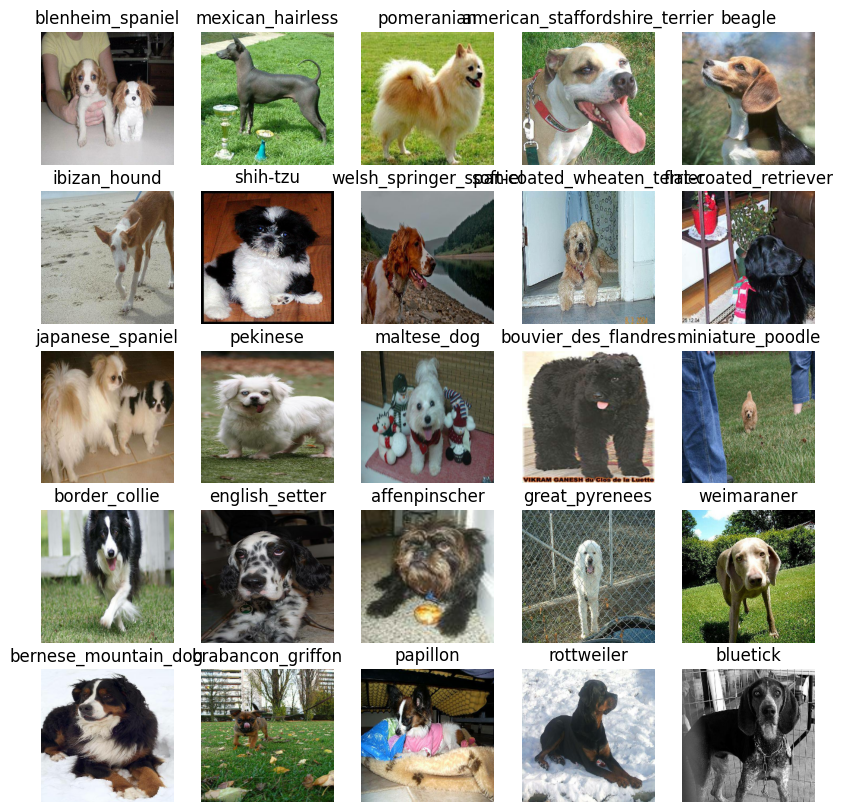

In [30]:
show_25_images(train_images, train_labels)

## Building a model

We will use mobilenet-v2 as our model.

* The URL of the model we want to use. - https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true

In [34]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

Now we've got our inputs, outputs and model ready to go, Let's put them together into a Keras deep learning model!



In [35]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, out_put=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with', MODEL_URL)

  # Set random seed
  tf.random.set_seed(42)

  # Setup the model layers
  model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL),  # Layer 1 (input layer)
        tf.keras.layers.Dense(4000, activation='relu'),
        tf.keras.layers.Dropout(rate=0.5, seed=42),
        tf.keras.layers.Dense(2000, activation='relu'),
        tf.keras.layers.Dropout(rate=0.5, seed=42),
        tf.keras.layers.Dense(1000, activation='relu'),
        tf.keras.layers.Dense(500, activation='relu'),
        tf.keras.layers.Dense(250, activation='relu'),
        tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax')  # Layer 2 (output layer)
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Nadam(learning_rate=0.0001),
      metrics=['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [36]:
model = create_model()
model.summary()

Building model with https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 4000)              4008000   
                                                                 
 dropout (Dropout)           (None, 4000)              0         
                                                                 
 dense_1 (Dense)             (None, 2000)              8002000   
                                                                 
 dropout_1 (Dropout)         (None, 2000)              0         
                                                                 
 dense_2 (Dense)             (None, 1000)             

## Creating callbacks



In [31]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [32]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Portfolio/Dog-vision-project/logs',
                        # Make it so the logs get tracked whenever we runu an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.


In [33]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 25 #@param {type:'slider', min:10, max:100, step:5}

In [ ]:
# Build a funciton to train and return a trained model
def train_model():
  '''
  Train a given model and returns the trained version.
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  history = model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/25
266/266 [==============================] - 168s 424ms/step - loss: 3.2074 - accuracy: 0.2866 - val_loss: 0.9835 - val_accuracy: 0.6987
Epoch 2/25
266/266 [==============================] - 41s 153ms/step - loss: 1.0385 - accuracy: 0.6873 - val_loss: 0.7714 - val_accuracy: 0.7627
Epoch 3/25
266/266 [==============================] - 41s 153ms/step - loss: 0.7304 - accuracy: 0.7751 - val_loss: 0.6812 - val_accuracy: 0.7813
Epoch 4/25
266/266 [==============================] - 40s 149ms/step - loss: 0.5937 - accuracy: 0.8118 - val_loss: 0.6450 - val_accuracy: 0.7860
Epoch 5/25
266/266 [==============================] - 45s 171ms/step - loss: 0.4855 - accuracy: 0.8455 - val_loss: 0.6528 - val_accuracy: 0.7940
Epoch 6/25
266/266 [==============================] - 46s 171ms/step - loss: 0.4085 - accuracy: 0.8712 - val_loss: 0.6606 - val_accuracy: 0.

loss: 0.0297 - accuracy: 0.9935 - val_loss: 0.8340 - val_accuracy: 0.7965

54/54 [==============================] - 7s 138ms/step - loss: 0.0331 - accuracy: 0.9959 - val_loss: 0.9988 - val_accuracy: 0.7433

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [5]:
%tensorboard --logdir /content/drive/MyDrive/Portfolio/Dog-vision-project/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [37]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

47/47 [==============================] - 197s 4s/step


array([[2.3616425e-13, 8.1096363e-10, 1.8996797e-09, ..., 1.3275998e-07,
        1.3215288e-09, 6.4449140e-11],
       [8.5038266e-08, 1.4030531e-10, 1.0838299e-09, ..., 1.5378759e-09,
        4.5016668e-12, 3.1641971e-08],
       [2.2747898e-03, 5.4951429e-06, 8.1609964e-04, ..., 9.6109157e-05,
        1.7811864e-04, 8.8366849e-04],
       ...,
       [7.5275203e-08, 5.3457404e-07, 3.1716441e-05, ..., 4.4763815e-06,
        2.6368839e-03, 1.1708071e-06],
       [1.9849299e-10, 3.4597483e-07, 9.9655517e-07, ..., 8.1532680e-06,
        3.0446074e-07, 1.4741039e-07],
       [5.4149676e-09, 4.2658663e-09, 2.8480839e-08, ..., 1.3099875e-05,
        1.3594469e-06, 1.8155426e-08]], dtype=float32)

In [38]:
# Let's check the predictions
index = 0
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum:{np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[2.36164251e-13 8.10963630e-10 1.89967975e-09 1.67909409e-10
 3.56686598e-07 2.12756990e-04 1.52489230e-10 6.41921724e-06
 4.55080993e-07 7.40133646e-06 8.08257281e-12 6.69531133e-08
 1.07479394e-07 3.59446908e-08 2.57421573e-09 2.53437889e-07
 1.29404334e-10 1.74359727e-08 1.17168011e-10 4.13053342e-10
 8.16935616e-11 5.30153832e-09 3.91765766e-08 5.13739294e-11
 2.01919406e-07 1.69706985e-10 1.72997765e-13 2.29204655e-08
 5.31267773e-11 5.32080602e-09 1.91542728e-08 1.22765728e-10
 1.53829120e-11 1.31970757e-09 5.29813560e-15 4.70536162e-15
 1.56668722e-08 3.94295832e-08 9.31466886e-08 2.37525640e-07
 5.25962962e-09 1.62132405e-10 9.99748707e-01 6.73946787e-10
 2.72024159e-09 2.30109282e-11 1.60392810e-09 4.12659062e-09
 1.36446132e-10 7.70050779e-09 9.15227361e-09 1.39647560e-09
 3.23813931e-09 1.96077108e-05 5.94476690e-11 2.22338528e-07
 1.90396090e-08 1.91360591e-11 1.80942230e-13 6.51847576e-10
 1.69835623e-09 1.34647593e-09 3.22086420e-11 1.25403243e-08
 9.13604400e-11 1.365591

In [ ]:
# Turn prediciton probabilities into their respective label (easier to understand)
def get_pred_label (prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label.
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediciton probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'entlebucher'

Now since our validation data is still in a batch dataset, we'll have to unbathchify it to make predictions on the validation images and then comapre those predictions to the validation labels (truth labels).

In [39]:
# Create a function to unbatch your dataset
def unbathchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  '''
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbathchify(val_data)
val_images[0], val_labels[0]

(array([[[0.96884924, 0.9701885 , 0.6773138 ],
         [0.9649684 , 0.9649684 , 0.6752449 ],
         [0.97255224, 0.97255224, 0.6897149 ],
         ...,
         [0.94544876, 0.93533266, 0.63851905],
         [0.9122807 , 0.90027964, 0.59165734],
         [0.6266023 , 0.6167168 , 0.30141547]],
 
        [[0.9636907 , 0.9677085 , 0.69290984],
         [0.97148985, 0.97514886, 0.7090773 ],
         [0.9998248 , 0.99992114, 0.74782914],
         ...,
         [0.97280353, 0.9686894 , 0.715118  ],
         [0.9849285 , 0.99132735, 0.7000457 ],
         [0.8505023 , 0.8618907 , 0.55982476]],
 
        [[0.94763345, 0.9589167 , 0.70516145],
         [0.96966976, 0.9795524 , 0.73575866],
         [0.9953722 , 0.99858195, 0.7804973 ],
         ...,
         [0.8728771 , 0.8872267 , 0.69398195],
         [0.8451019 , 0.8824005 , 0.6274633 ],
         [0.7930096 , 0.83910555, 0.5551244 ]],
 
        ...,
 
        [[0.47171637, 0.37899917, 0.3959688 ],
         [0.23060554, 0.1464493 , 0.15993

Let's make some function to make these all bit more visualize.



In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, groud truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('P: {} {:2.0f}% T: {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)



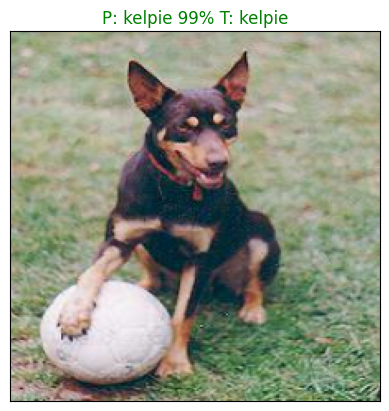

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

Let's make another to view our models top 10 predictions.


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup a plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

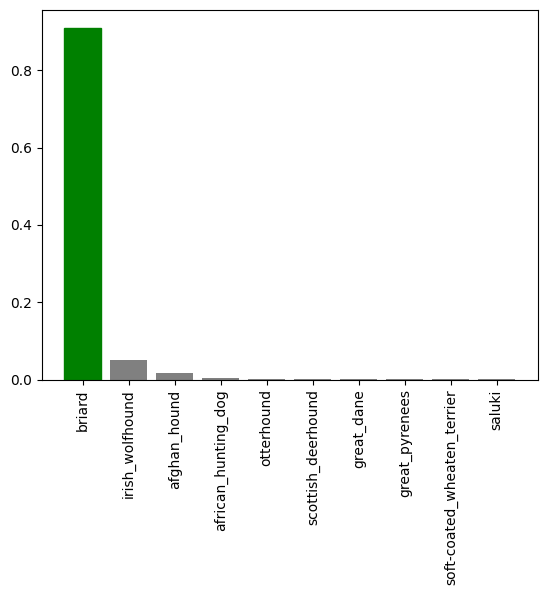

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=86)

Now we've got some function to help us visualize our predicitions and evaluate our model, let's check out few.

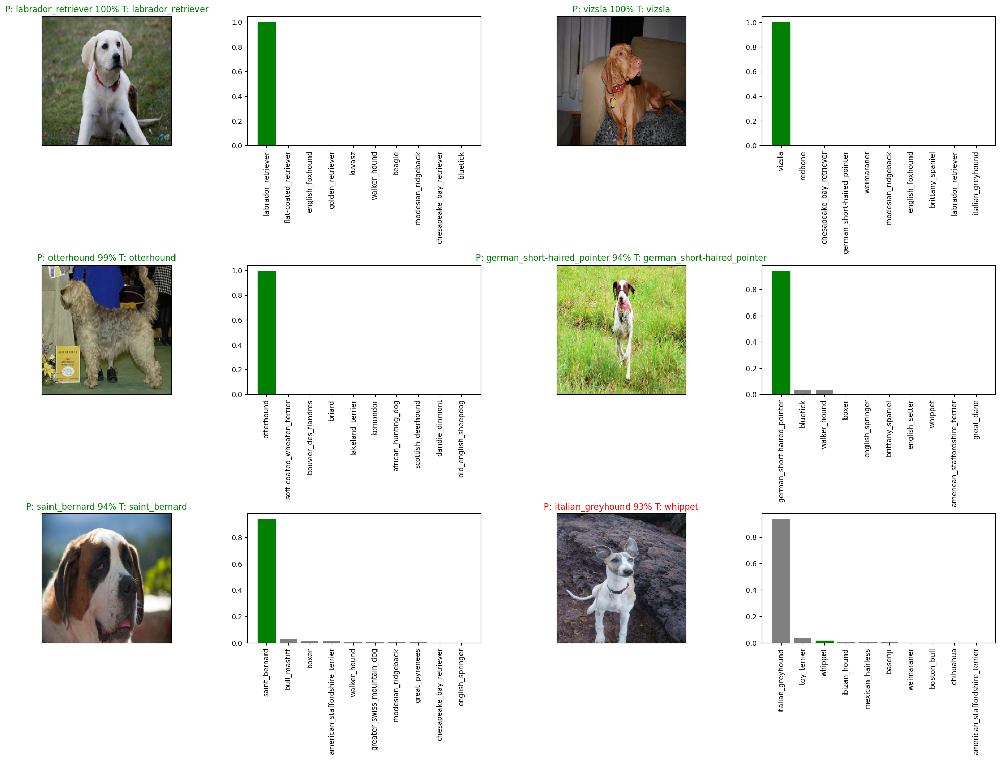

In [ ]:
# Let's check out a few predictions an their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()

### Confusion Matrix

Let's check our model with a confusion matrix.

In [ ]:
import itertools

def make_confusion_matrix(y_true, y_pred, classes=None, figsize = (30, 30), text_size=5):

  # Create the confusion matrix
  cm =  confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # normalize our confusion matrix
  n_classes = cm.shape[0]

  # Let's prettify it
  fig, ax = plt.subplots(figsize=figsize)
  # Create a matrix plot
  cax = ax.matshow(cm, cmap=plt.cm.Blues)
  fig.colorbar(cax)

   # Set labels to be classes
  if classes is not None and len(classes) > 0:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title='Confusion Matrix',
        xlabel='Predicted Label',
        ylabel='True Label',
        xticks=np.arange(n_classes),
        yticks=np.arange(n_classes),
        xticklabels=labels,
        yticklabels=labels)

  # Set x-axis labels to bottom and rotate them vertically
  ax.xaxis.set_label_position('bottom')
  ax.xaxis.tick_bottom()
  plt.xticks(rotation=90)  # Rotate the x-axis labels by 90 degrees

  # Adjust label size
  ax.yaxis.label.set_size(20)
  ax.xaxis.label.set_size(20)
  ax.title.set_size(20)

  # Set threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  # for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
  #   plt.text(j, i, f'{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)',
  #           horizontalalignment='center',
  #           color='white' if cm[i, j] > threshold else 'black',
  #           size=text_size)


In [40]:
def make_prediction_list(predictions):
  prediction_labels=[]
  for index, value in enumerate(predictions):
    prediction_labels.append(unique_breeds[np.argmax(predictions[index])])

  return prediction_labels

In [41]:
preds_labeled = make_prediction_list(predictions)

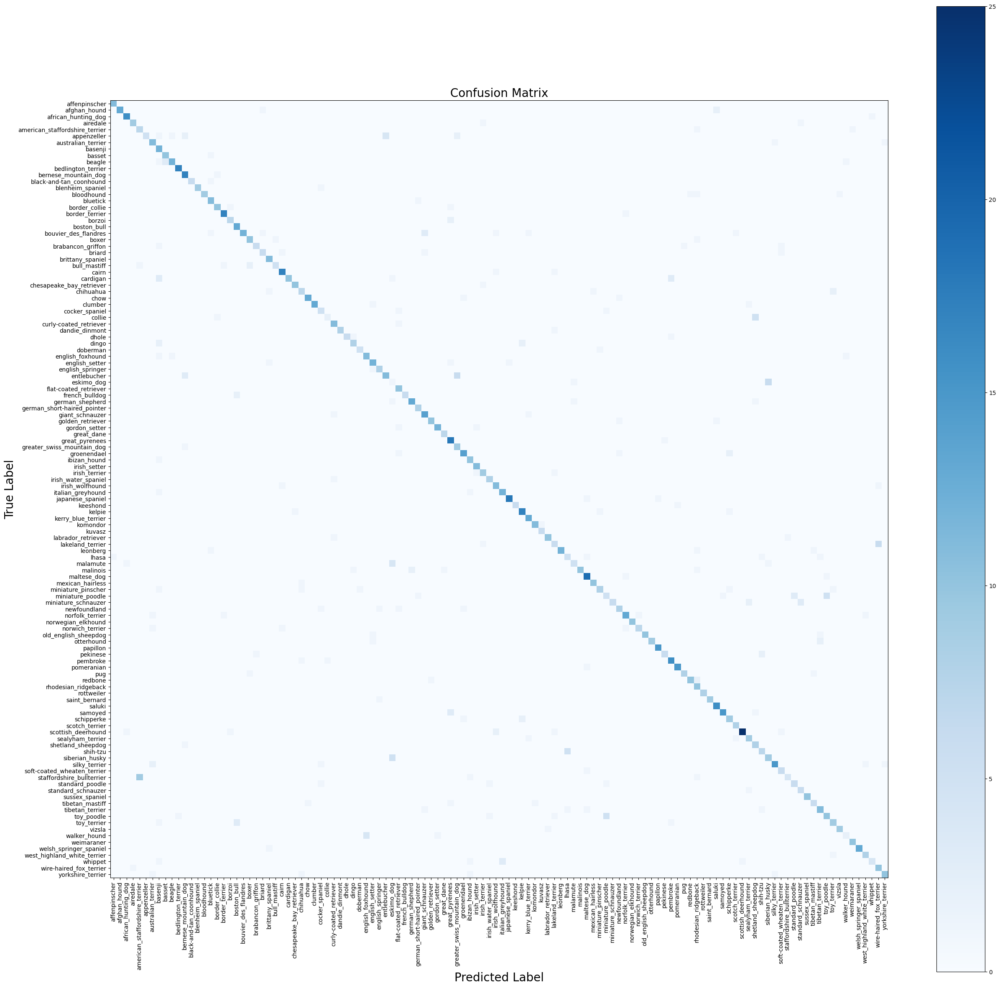

In [ ]:
make_confusion_matrix(y_true=val_labels, y_pred=preds_labeled, classes=unique_breeds)

In the confusion matrix we can see that some dog breeds are little bit difficult to predict for our model.

This can be improved by getting more data.

## Saving and reloading a trained model

In [34]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a models directory and appends a suffix (string).
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Portfolio/Dog-vision-project/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [35]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Load a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 10000 images
save_model(model, suffix='10000-images-mobilenetv2-Nadam')

Saving model to: /content/drive/MyDrive/Portfolio/Dog-vision-project/models/20240115-10381705315139-10000-images-mobilenetv2-Nadam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Portfolio/Dog-vision-project/models/20240115-10381705315139-10000-images-mobilenetv2-Nadam.h5'

In [36]:
# Load a trained model
loaded_10000_image_model = load_model('/content/drive/MyDrive/Portfolio/Dog-vision-project/models/20240115-10381705315139-10000-images-mobilenetv2-Nadam.h5')

Loading saved model from: /content/drive/MyDrive/Portfolio/Dog-vision-project/models/20240115-10381705315139-10000-images-mobilenetv2-Nadam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

47/47 [==============================] - 6s 128ms/step - loss: 0.6879 - accuracy: 0.7920


[0.6879174113273621, 0.7919999957084656]

In [ ]:
# Evaluate the loaded model
loaded_10000_image_model.evaluate(val_data)

47/47 [==============================] - 6s 111ms/step - loss: 0.6879 - accuracy: 0.7920


[0.6879174113273621, 0.7919999957084656]

### Clasification report

Let's vizualize our classidication report

In [43]:
print(classification_report(y_true=val_labels, y_pred=preds_labeled))

                                precision    recall  f1-score   support

                 affenpinscher       0.92      1.00      0.96        11
                  afghan_hound       1.00      0.81      0.90        16
           african_hunting_dog       0.89      0.94      0.91        17
                      airedale       0.90      0.82      0.86        11
american_staffordshire_terrier       0.41      0.78      0.54         9
                   appenzeller       1.00      0.33      0.50        15
            australian_terrier       0.69      0.85      0.76        13
                       basenji       0.46      1.00      0.63        12
                        basset       0.77      0.91      0.83        11
                        beagle       0.86      0.71      0.77        17
            bedlington_terrier       0.94      1.00      0.97        17
          bernese_mountain_dog       0.71      0.94      0.81        18
       black-and-tan_coonhound       1.00      0.86      0.92  

In the classificatio report we can see that our model make good predictions with most of the dog breeds, and improve the lower results, we should provide more data at the training step.